# Análise e Classificação de Faces: Visão Computacional com OpenCv

In [1]:
#conda install -c conda-forge opencv
#conda install -c conda-forge dlib

In [81]:
import cv2
import dlib
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import accuracy_score

from os import listdir, path, makedirs
from os.path import isfile, join
import shutil

## Analisando os canais de cor de uma imagem:

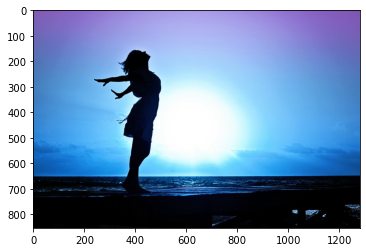

In [3]:
# Abrindo uma imagem utilizando o opencv:

imagem = cv2.imread('images/px-girl.jpg')

plt.imshow(imagem)

### O opencv utiliza, por padrão, imagens em BGR (blue-green-red). 

### Note que a leitura da imagem foi feita pelo OpenCv e a visualização da imagem foi viabilizada pelo matplotlib, que utiliza o padrão RGB (red-blue-green)

### É necessária, portanto, uma conversão antes da plotagem.

In [4]:
# Convertendo uma imagem BGR para RGB:

imagem_rgb = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

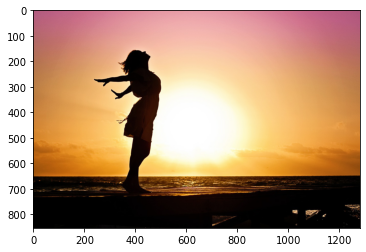

In [5]:
# Plotando novamente:

plt.imshow(imagem_rgb)

In [6]:
# Detalhes da imagem:

print('Shape: ', imagem_rgb.shape)
print(f'pixels: {imagem_rgb.shape[:2]}, canais de cor: {imagem_rgb.shape[2]}')

Shape:  (853, 1280, 3)
pixels: (853, 1280), canais de cor: 3


In [7]:
# Convertendo a imagem para a escala de cinzas:

imagem_cinza = cv2.cvtColor(imagem_rgb, cv2.COLOR_RGB2GRAY)

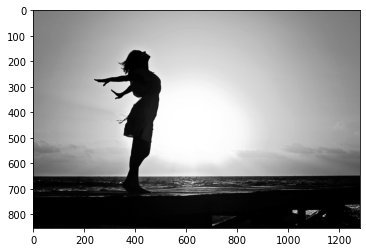

In [8]:
plt.imshow(imagem_cinza, cmap = 'gray')

In [9]:
# Note que a imagem em tons de cinza tem apenas 1 canal:

imagem_cinza.shape

(853, 1280)

## Região de interesse (RoI - Region of Interest):

In [10]:
# Abrindo e convertendo outra imagem:

imagem = cv2.imread('images/px-people.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

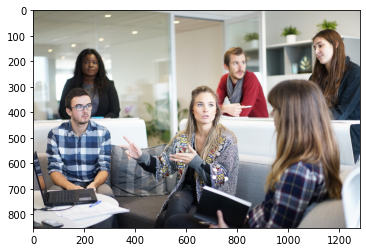

In [11]:
plt.imshow(imagem)

#### Sabemos que uma imagem é uma matriz. Neste caso, uma matriz de (853 x 1280) pixels.

#### Suponha que desejemos selecionar, como regiao de interesse, o rosto da pessoa de pé no canto direito superior.

#### Vamos "chutar" que ela esteja, mais ou menos, entre as posições (100:200 e 1000:1200).

In [12]:
imagem_roi = imagem[100:200, 1000:1200]

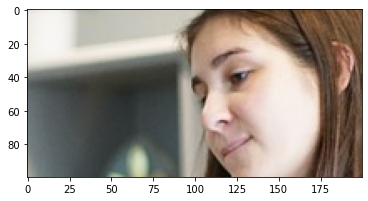

In [13]:
plt.imshow(imagem_roi)

#### Esta é uma extração manual.

In [14]:
# Para salvar essa extração:

# Converter novamente para BGR:
imagem_roi_bgr = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)

# Salvar a imagem:
cv2.imwrite('images/imagem_roi_bgr.png', imagem_roi_bgr)

True

***

### Exercício:

* Identificar o corpo da pessoa manualmente
* Converter a RoI em escala de cinza
* Incluir a RoI novamente na imagem colorida

In [15]:
# Leitura da imagem e conversão de BGR para RGB:

imagem_exer = cv2.imread('images/girl.png')

imagem_exer_rgb = cv2.cvtColor(imagem_exer, cv2.COLOR_BGR2RGB)

Text(0.5, 1.0, 'Imagem inteira em RGB COLORIDA - GAROTA')

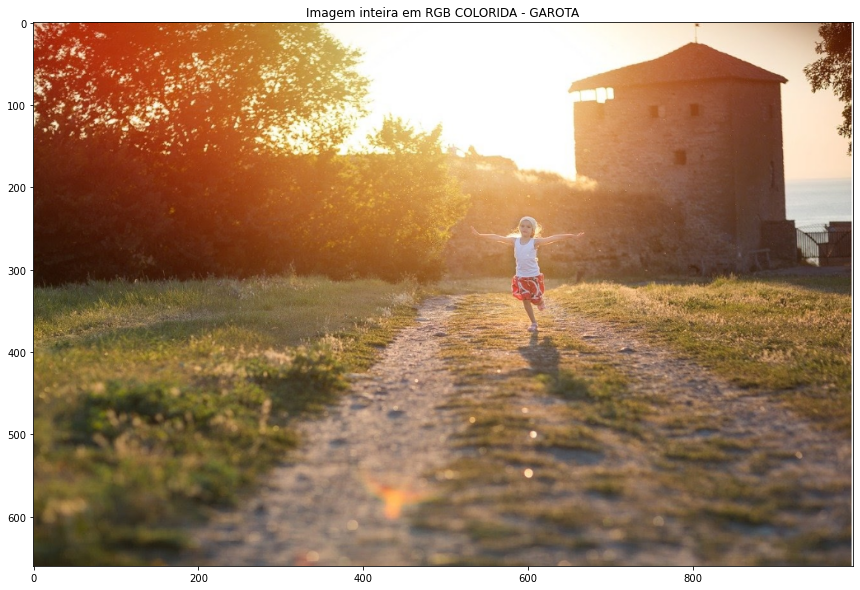

In [16]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_exer_rgb)
plt.title('Imagem inteira em RGB COLORIDA - GAROTA')

In [17]:
# RoI:

imagem_exer_roi = imagem_exer_rgb[225:380, 530:670]

Text(0.5, 1.0, 'RoI - GAROTA')

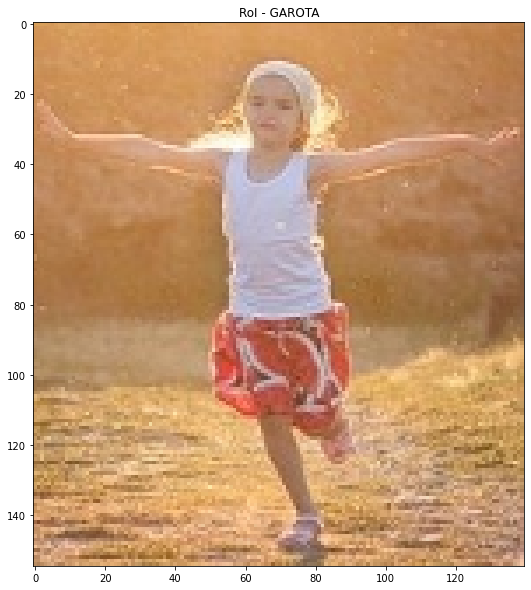

In [18]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_exer_roi)
plt.title('RoI - GAROTA')

In [19]:


# Conversão para a escala de cinza:

imagem_exer_cinza = cv2.cvtColor(imagem_exer_roi, cv2.COLOR_RGB2GRAY)

Text(0.5, 1.0, 'RoI - GAROTA')

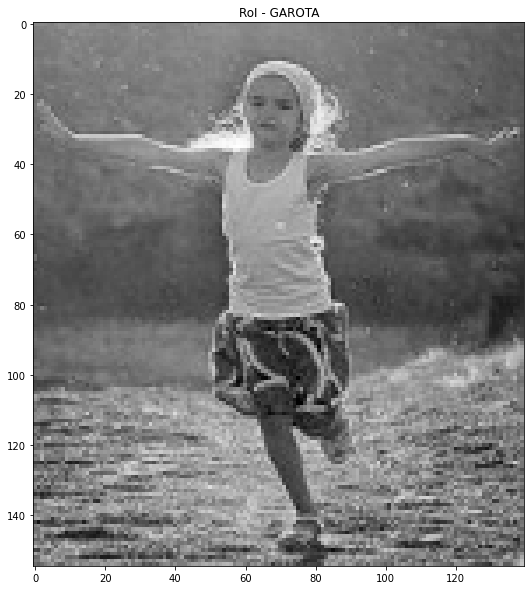

In [20]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_exer_cinza, cmap = 'gray')
plt.title('RoI - GAROTA')

In [21]:
# Convertendo a foto em escala de cinza (apenas 1 canal de cor) para RGB:

imagem_cinza_rgb = cv2.cvtColor(imagem_exer_cinza, cv2.COLOR_GRAY2RGB)

In [22]:
imagem_exer_rgb[225:380, 530:670] = imagem_cinza_rgb

Text(0.5, 1.0, 'Corpo inteiro')

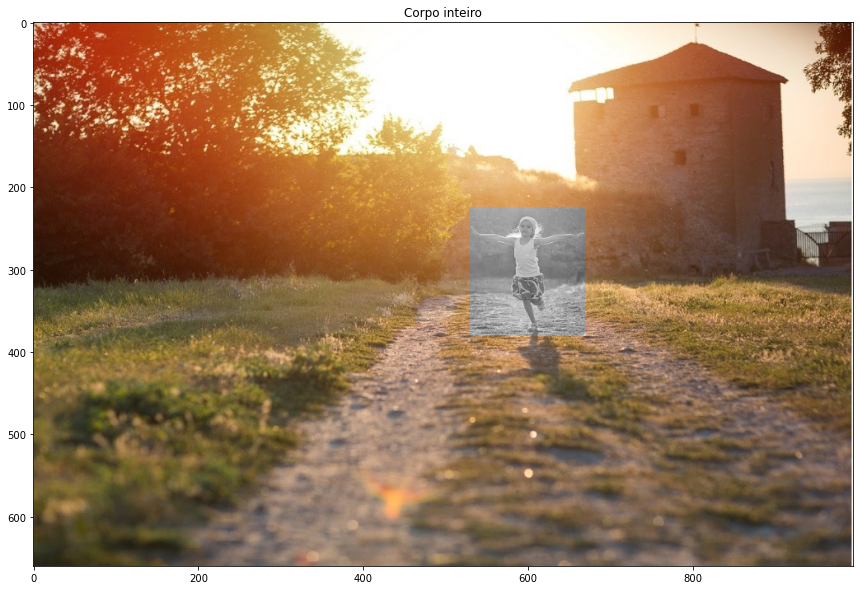

In [23]:
plt.figure(figsize=(20,10))
plt.imshow(imagem_exer_rgb)
plt.title("Corpo inteiro")

***

### Classificador de cascata de Haar:

In [24]:
# Abrindo a imagem e convertendo para RGB:

imagem = cv2.imread('images/px-people.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

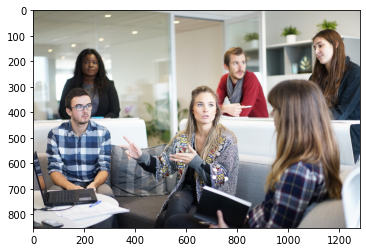

In [25]:
# Visualização:

plt.imshow(imagem)

#### O classificador de Haar trabalha com imagens em escala de cinza. É necessária, portanto, a conversão:

In [26]:
imagem_cinza = cv2.cvtColor(imagem, cv2.COLOR_RGB2GRAY)

In [27]:
# Carregando o classificador especializado em rostos frontais:

classificador = cv2.CascadeClassifier('classificadores/haarcascade_frontalface_default.xml')

In [28]:
faces = classificador.detectMultiScale(imagem_cinza, 1.3, 5)

#### Parâmetros utilizados acima:

* 1.3: refere-se à escala. Dada uma imagem, ela será diminuída num processo chamado de piradimização.

* Para resolver a questão de escala nas imagens, existe um parâmetro do método de detecção (detectMultiScale) deste tipo de classificador, conhecido por scaleImage. Ele é capaz de redimensionar uma imagem maior até a dimensão definido no modelo. Por exemplo, se o valor deste parâmetro for 1.3, significa que a imagem a ser analisada será redimensionada (diminuir o tamanho) em 30% por etapa até alcançar a dimensão limite do modelo.

* 5: número mínimo de características vizinhas que o classificador vai considerar. Assim, o Haar Cascade tem uma condição que vai juntar uma série de características. Se essas características minimamente “setadas” nesse parâmetro, como por exemplo 5, que é o padrão, forem atingidas, ele vai separar aquela região dizendo que é um rosto.

In [29]:
# Quantidade de rostos identificados:

len(faces)

5

In [30]:
 # Visualizando uma das faces selecionadas automaticamente:
    
faces[0]

array([189, 176,  75,  75], dtype=int32)

#### Entendendo o array:

* x = 189, y = 176 : coordenadas
* 75 x 75 : dimensões

#### Assim sendo, temos as coordenadas de cada face identificada. Faremos uma cópia da imagem e serão desenhados retângulos com as coordenadas coletadas.

In [31]:
imagem_anotada = imagem.copy()

In [32]:
for (x, y, w, h) in faces:
    cv2.rectangle(imagem_anotada, (x,y), (x+w, y+ h), (255, 255, 0), 2)

#### Parâmetros (255, 255, 0) >> Cor amarela
#### Parâmetro 2: espessura

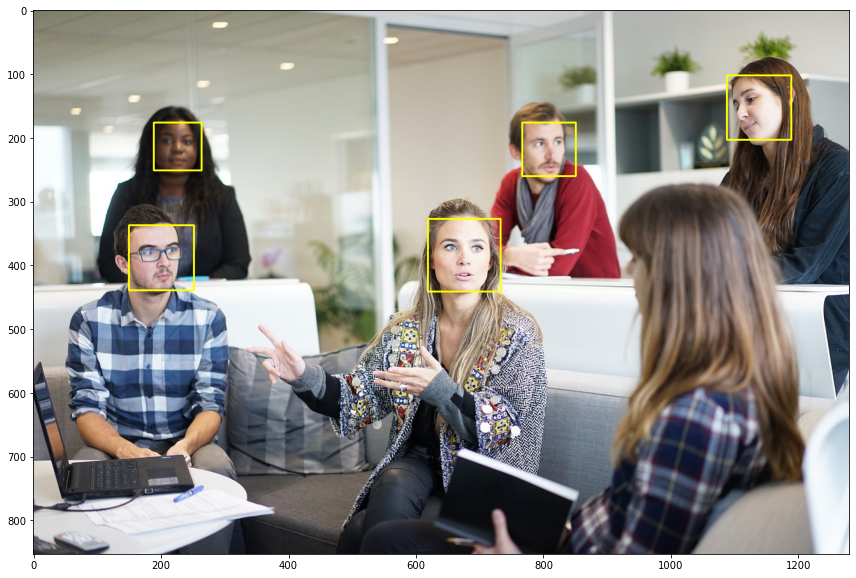

In [33]:
plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [34]:
# Recortando e salvando as imagens das faces:

face_imagem = 0

for (x,y,w,h) in faces:
    face_imagem += 1
    imagem_roi = imagem[y:y+h, x:x+w]
    imagem_roi = cv2.cvtColor(imagem_roi, cv2.COLOR_RGB2BGR)
    cv2.imwrite('images/face_' + str(face_imagem) + '.png', imagem_roi)

***

### Exercício: Identificar, recortar e salvar o rosto da imagem abaixo:

In [35]:
# Abrindo a imagem e convertendo-a:

imagem_exer2 = cv2.imread('images/exer2.png')
imagem_exer2_rgb = cv2.cvtColor(imagem_exer2, cv2.COLOR_BGR2RGB)

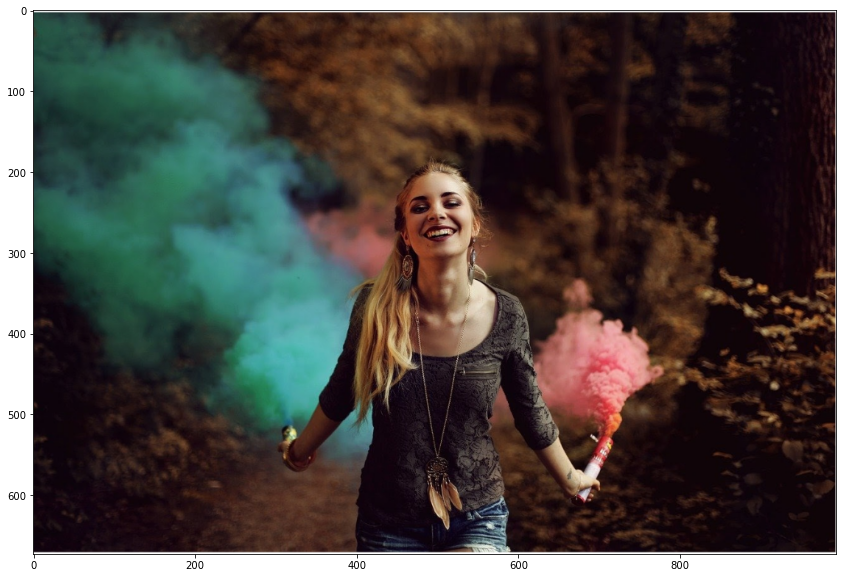

In [36]:
# Visualização:

plt.figure(figsize = (20,10))
plt.imshow(imagem_exer2_rgb)

In [37]:
# Conversão para a escala de cinza:

imagem_exer2_cinza = cv2.cvtColor(imagem_exer2_rgb, cv2.COLOR_RGB2GRAY)

In [38]:
# Utilizando o classificador para encontrar a face:

face_exer2 = classificador.detectMultiScale(imagem_exer2_cinza, 1.3, 5)

In [39]:
face_exer2

array([[449, 197, 100, 100]], dtype=int32)

In [40]:
# Criando uma copia da imagem para anotação:

imagem_exer2_anotada = imagem_exer2_rgb

In [41]:
imagem_exer2_anotada = cv2.rectangle(imagem_exer2_anotada, (449,197), (549, 297), (255, 255, 0), 2)

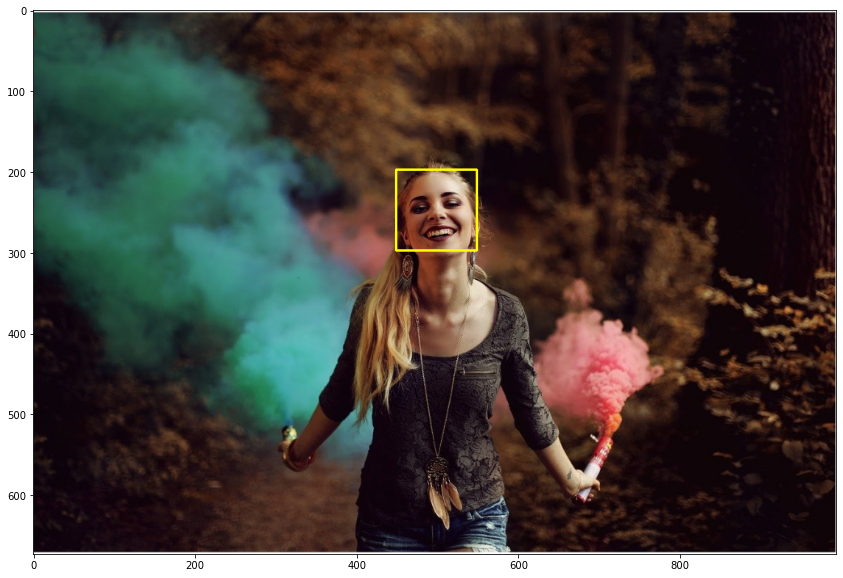

In [42]:
# Visualização:

plt.figure(figsize = (20,10))
plt.imshow(imagem_exer2_anotada)

In [43]:
# Salvando a imagem:

imagem_exer2_roi = imagem_exer2_rgb[197:297, 449:549 ]
imagem_exer2_roi = cv2.cvtColor(imagem_exer2_roi, cv2.COLOR_RGB2BGR)
cv2.imwrite('images/face_exer2.png', imagem_exer2_roi)

True

### Repositório de modelos de classificadores em cascata de Haar No repositório oficial do [OpenCV](https://github.com/opencv/opencv/tree/master/data/haarcascades) existe uma pasta com vários modelos já treinados para diferentes tipos de problemas, desde classificação de gatos até mesmo placas de automóveis russos.

### Classificação de faces já segmentadas:

In [44]:
# Importação da imagem e conversão para RGB:

imagem_face_1 = cv2.imread('images/cropped_faces/s01_01.jpg')
imagem_face_1 = cv2.cvtColor(imagem_face_1, cv2.COLOR_BGR2RGB)

imagem_face_2 = cv2.imread('images/cropped_faces/s02_01.jpg')
imagem_face_2 = cv2.cvtColor(imagem_face_2, cv2.COLOR_BGR2RGB)

imagem_face_3 = cv2.imread('images/cropped_faces/s03_01.jpg')
imagem_face_3 = cv2.cvtColor(imagem_face_3, cv2.COLOR_BGR2RGB)

#### Sobre os arquivos da pasta cropped_faces: imagem identificada por Numero do sujeito + numero da imagem, onde cada sujeito tem 15 imagens diferentes.

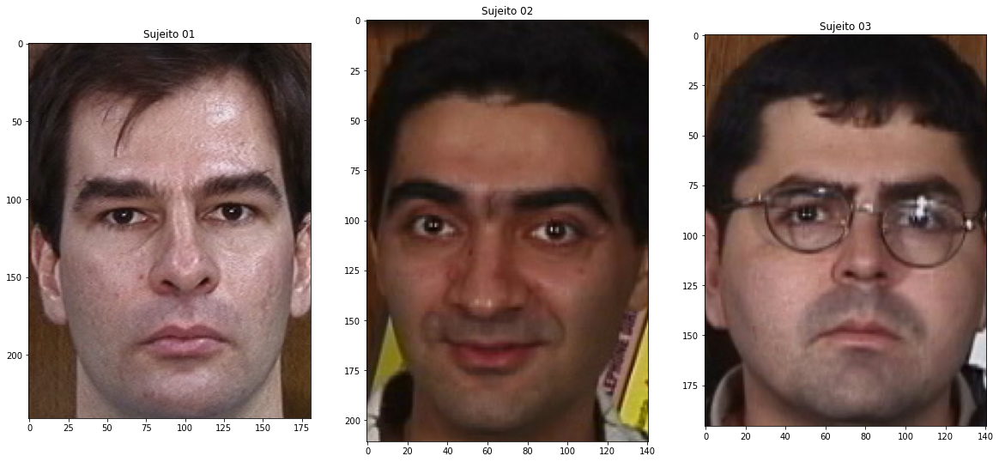

In [45]:
#Plotando as imagens:


# Imagem 01:
plt.figure(figsize = (20,10))
plt.subplot(131)                   # Numero de subgraficos
plt.title('Sujeito 01')
plt.imshow(imagem_face_1)

#Imagem 02:
plt.subplot(132)
plt.title('Sujeito 02')
plt.imshow(imagem_face_2)

# Imagem 03:
plt.subplot(133)
plt.title('Sujeito 03')
plt.imshow(imagem_face_3)

#### Como as imagens têm tamanhos diferentes, é preciso normalizá-las, isto é, deixá-las do mesmo tamanho.

#### Sobre o dataset: Conforme mencionado, cada sujeito possui 15 imagens. Estas foram divididas da seguinte forma: 10 imagens paara treino (de cada um) e 5 imagens para teste (também de cada um).

#### Criação de 2 pastas adicionais a partir da pasta cropped_faces: treino e teste.

In [46]:
faces_caminho = 'images/cropped_faces/'

In [47]:
# Verificação arquivo por arquivo dentro do diretório indicado. Busca somente por arquivos. Outros diretórios serão ignorados.

lista_arq_faces = [f for f in listdir(faces_caminho) if isfile(join(faces_caminho, f))]

In [48]:
lista_arq_faces[0]

's49_15.jpg'

In [49]:
faces_path_treino = 'images/treino/'
faces_path_teste = 'images/teste/'

In [50]:
# Criação das pastas: Se elas já não existirem, serão criadas.

if not path.exists(faces_path_treino):
    makedirs(faces_path_treino)
    
if not path.exists(faces_path_teste):
    makedirs(faces_path_teste)
    

# Adicionando os arquivos às pastas:

for arq in (lista_arq_faces):
    sujeito = arq[1:3] # posições do número do sujeito no nome do arquivo
    numero = arq[4:6]  # posições do número da foto do sujeito acima
    
    if int(numero) <= 10:
        shutil.copyfile(faces_caminho + arq, faces_path_treino + arq)
    else:
        shutil.copyfile(faces_caminho + arq, faces_path_teste + arq)

In [51]:
# Redimensionamento e conversão do espaço de cores para a escala de cinza:

def padronizar_imagem(imagem_caminho):
    
    #Já abriremos a imagem em escala de cinza
    imagem = cv2.imread(imagem_caminho, cv2.IMREAD_GRAYSCALE) 
    #Redimensionamento
    imagem = cv2.resize(imagem, (200,200), interpolation = cv2.INTER_LANCZOS4)
    return imagem

#### Parâmetro interpolation: Ao aumentarmos uma imagem, precisamos escolher um algoritmo de interpolação que preencherá os espaços vazios.

In [52]:
# Criação de 2 listas com imagens de treino e de teste:

lista_faces_treino = [f for f in listdir(faces_path_treino) if isfile(join(faces_path_treino, f))]
lista_faces_teste = [f for f in listdir(faces_path_teste) if isfile(join(faces_path_teste,f))]

In [53]:
dados_treino, sujeitos = [] , []

In [54]:
# Rotina para alimentar 2 listas: 
#lista dados_treino: faces já padronizadas
#lista sujeitos: identificacão do sujeito 

for i, arq in enumerate(lista_faces_treino):
    imagem_path = faces_path_treino + arq
    imagem = padronizar_imagem(imagem_path)
    dados_treino.append(imagem)
    sujeito = arq[1:3] 
    sujeitos.append(int(sujeito))

In [55]:
len(dados_treino)

500

In [56]:
len(sujeitos)

500

In [57]:
len(dados_treino)

500

In [58]:
# Repetindo a rotina acima para os dados de teste:

dados_teste, sujeitos_teste = [] , []


In [59]:
for i, arq in enumerate(lista_faces_teste):
    imagem_path = faces_path_teste + arq
    imagem = padronizar_imagem(imagem_path)
    dados_teste.append(imagem)
    sujeito = arq[1:3] 
    sujeitos_teste.append(int(sujeito))

In [60]:
len(dados_teste)

250

## Algoritmos de Classificação:

***

### Modelo de Eingen Faces:

In [61]:
# É necessário converter os arrays para o formato de 32 bits para começarmos a classificação:

sujeitos = np.asarray(sujeitos, dtype = np.int32)
sujeitos_teste = np.asarray(sujeitos_teste, dtype = np.int32)

In [62]:
# Criando o modelo:

modelo_eigenfaces = cv2.face.EigenFaceRecognizer_create()

In [63]:
modelo_eigenfaces.train(dados_treino, sujeitos)

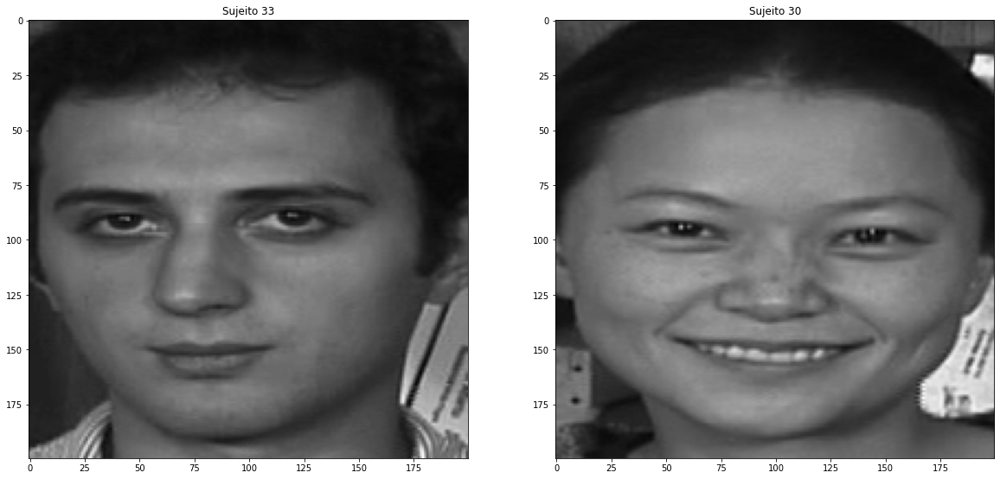

In [64]:
plt.figure(figsize = (20,10))
plt.subplot(121)
plt.title('Sujeito '+ str(sujeitos_teste[6]))
plt.imshow(dados_teste[6], cmap = 'gray')

plt.subplot(122)
plt.title('Sujeito '+ str(sujeitos_teste[7]))
plt.imshow(dados_teste[7], cmap = 'gray')

plt.show()

#### As imagens acima são imagens de teste, ou seja, elas não participaram do treinamento do modelo.

#### Vamos agora utilizá-las como entrada para o modelo, a fim de que o mesmo identifique esses sujeitos conforme seu treinamento.

In [65]:
predicao = modelo_eigenfaces.predict(dados_teste[6])
predicao

(33, 4265.484917972824)

#### Note que o modelo identificou o sujeito 33 corretamente.

#### 4265 é a distância, no plano de faces, entre o sujeito fornecido como input e o(s) sujeitos(s) da base de treinamento do modelo.

In [66]:
predicao = modelo_eigenfaces.predict(dados_teste[7])
predicao

(30, 3747.853361845985)

#### O modelo acertou, novamente.

***

### Modelo de Fisher Faces: mais eficiente que o anterior.

In [67]:
# Criação do modelo:

modelo_fisherfaces = cv2.face.FisherFaceRecognizer_create()

In [68]:
# Treinando o modelo:

modelo_fisherfaces.train(dados_treino, sujeitos)

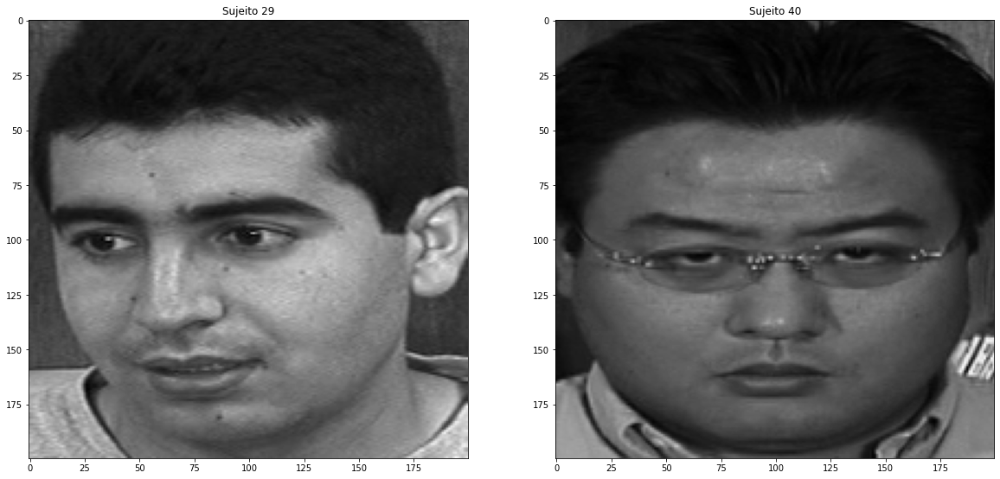

In [69]:
# Escolhendo imagens de teste:

plt.figure(figsize = (20,10))
plt.subplot(121)
plt.title('Sujeito '+ str(sujeitos_teste[10]))
plt.imshow(dados_teste[10], cmap = 'gray')

plt.subplot(122)
plt.title('Sujeito '+ str(sujeitos_teste[21]))
plt.imshow(dados_teste[21], cmap = 'gray')

plt.show()

In [70]:
# Fazendo predições:

predicao = modelo_fisherfaces.predict(dados_teste[10])
predicao

(9, 1138.5819653740568)

In [71]:
predicao = modelo_fisherfaces.predict(dados_teste[21])
predicao

(40, 1061.8541229786156)

#### O modelo errou a primeira predição e acertou a segunda.

***

### Classificador LBPH (Local Binary Pattern Histogram):

#### É considerado o mais robusto dos 3 até aqui porque possui filtros que atenuam efeitos de luminosidade e ruído que possam influenciar os outros 2.


In [73]:
# Criação do modelo:

modelo_LBPH = cv2.face.LBPHFaceRecognizer_create()

In [74]:
#Treinamento do modelo:

modelo_LBPH.train(dados_treino, sujeitos)

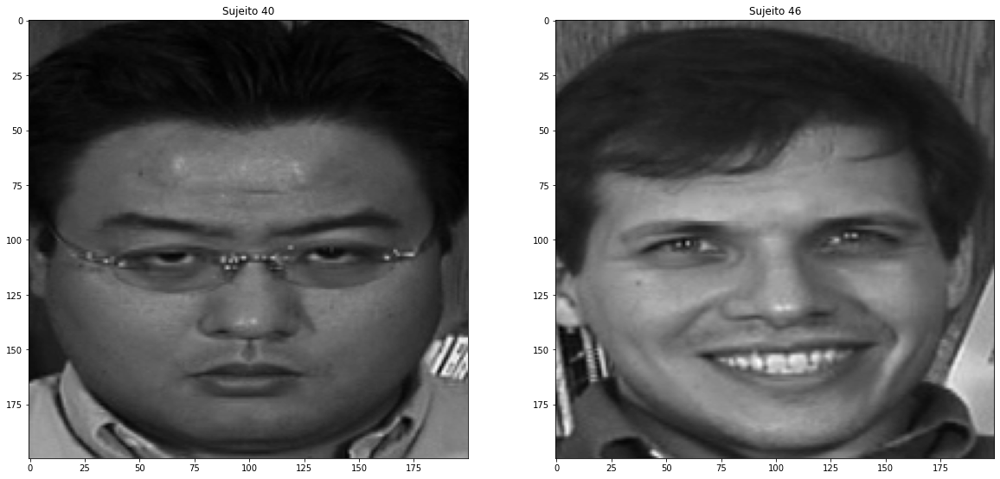

In [75]:
plt.figure(figsize=(20,10))

plt.subplot(121)
plt.title('Sujeito '+ str(sujeitos_teste[21]))
plt.imshow(dados_teste[21], cmap = 'gray')

plt.subplot(122)
plt.title('Sujeito '+ str(sujeitos_teste[27]))
plt.imshow(dados_teste[27], cmap = 'gray')

plt.show()

In [76]:
predicao = modelo_LBPH.predict(dados_teste[21])
predicao

(40, 44.15303926612681)

In [77]:
predicao = modelo_LBPH.predict(dados_teste[27])
predicao

(46, 39.029405157786755)

#### O modelo acertou as 2 predições.

***

## Calculando a acurácia dos modelos:

### Eingen:

In [84]:
# Criando uma lista para colocar as PREDIÇÕES do teste Eingen:

teste_eingen = []

for item in dados_teste:
    teste_eingen.append(modelo_eigenfaces.predict(item)[0]) # índice zero para pegar os sujeitos

In [83]:
# Cálculo da ACURÁCIA utilizando sklearn:

acuracia_eingen = accuracy_score(sujeitos_teste, teste_eingen)
acuracia_eingen

# O accuracy_score vai mostrar o quanto o modelo acertou.

0.724

#### A acurácia do Eingen foi de, aproximadamente, 72%.

***

### Fisher:

In [85]:
# Criando uma lista para colocar as PREDIÇÕES do teste Fisher:

teste_fisher = []

for item in dados_teste:
    teste_fisher.append(modelo_fisherfaces.predict(item)[0])

In [86]:
# Cálculo da ACURÁCIA:

acuracia_fisher = accuracy_score(sujeitos_teste, teste_fisher)
acuracia_fisher

0.52

#### A acurácia do Fisher foi de 52% para este conjunto de imagens.

***

### LBPH:

In [87]:
# Criando uma lista para colocar as PREDIÇÕES do teste LBPH:

teste_LBPH = []

for item in dados_teste:
    teste_LBPH.append(modelo_LBPH.predict(item)[0])

In [88]:
# Cálculo da ACURÁCIA:

acuracia_LBPH = accuracy_score(sujeitos_teste, teste_LBPH)
acuracia_LBPH

0.792

#### A acurácia do LBPH foi de 79% para este conjunto de imagens.

### Biblioteca Dlib:

In [91]:
# Abrindo e convertendo a imagem:

imagem = cv2.imread('images/px-woman-smilings.jpg')
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

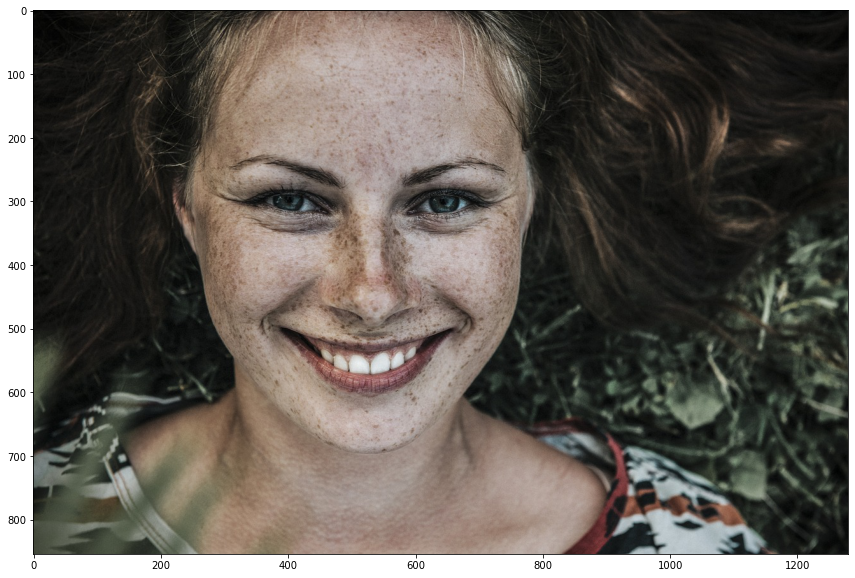

In [94]:
# Plotando a imagem:

plt.figure(figsize=(20,10))
plt.imshow(imagem
          )

### A biblioteca dlib tem 2 classificadores treinados:

#### Um pra 68 pontos e outro para 5 pontos. O de 5 pontos é mais rápido, em contrapartida, o de 68 pontos é mais eficiente.

In [96]:
classificador_dlib_68_path = 'classificadores/shape_predictor_68_face_landmarks.dat'
classificador_dlib = dlib.shape_predictor(classificador_dlib_68_path)

#Detector de face do dlib associado a esse classificador:
detector_face = dlib.get_frontal_face_detector()

In [102]:
# Função para anotar o rosto na imagem:

def anotar_rosto(imagem):
    # Parâmetro 1 pode ser aumentado caso a imagem possua outros rostos em diferentes tamanhos para identificar
    # O parâmetro = 1 faz a imagem NÃO ser redimensionada.
    retangulos = detector_face(imagem, 1)
    
    if len(retangulos) == 0:
        return None
    
    for i, direcoes in enumerate(retangulos):
        print('Identificado rosto ' + str(i))
        cv2.rectangle(imagem, (direcoes.left(), direcoes.top()), (direcoes.right(), direcoes.bottom()), (255,255,0), 2)
        
    return imagem
        
    

In [99]:
# PCriando uma cópia da imagem:

imagem_anotada = imagem.copy()
imagem_anotada = anotar_rosto(imagem_anotada)

Identificado rosto 0


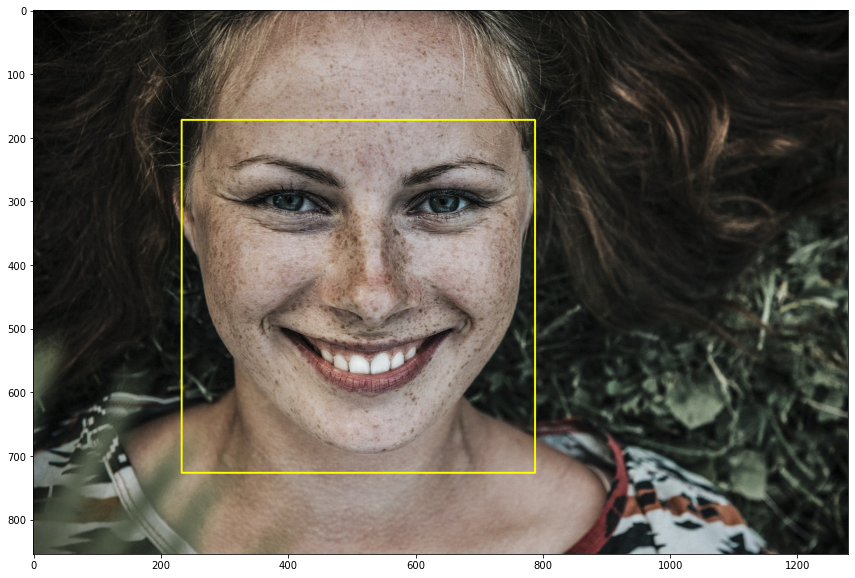

In [101]:
# Mostrando a imagem:

plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

### Identificação dos marcos faciais:

In [104]:
def pontos_marcos_faciais(imagem):
    
    # Primeiro precisamos achar a face
    retangulos = detector_face(imagem,1)
    
    if len(retangulos) == 0:
        return None
    
    marcos = []
    
    # Se houver faces, identificaremos os marcos faciais:
    for ret in retangulos:
        marcos.append(np.matrix([[p.x, p.y] for p in classificador_dlib(imagem, ret).parts()]))
        
    return marcos

In [105]:
# Utilizando a função:

marcos_faciais = pontos_marcos_faciais(imagem)

In [107]:
# Verificando que só existe 1 rosto identificado:

len(marcos_faciais)

1

In [108]:
# Verificando se o classificador encontrou os 68 pontos:

len(marcos_faciais[0])

68

In [109]:
# Criando uma função para anotar os marcos faciais:

def anotar_marcos_faciais(imagem, marcos):
    
    for marco in marcos:
        for idx, ponto in enumerate(marco):
            centro = (ponto[0,0], ponto[0,1])
            cv2.circle(imagem, centro, 3, (255, 255, 0), -1)
            cv2.putText(imagem, str(idx), centro, cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255),2)
            
    return imagem
            
# Parâmetro 3 é o raio.
# Parâmetro -1 pede para PINTAR o círculo
# Parâmetro 0.8 é o tamanho da fonte

In [110]:
# Utilizando a função:

imagem_anotada = imagem.copy()
imagem_anotada = anotar_marcos_faciais(imagem_anotada, marcos_faciais)

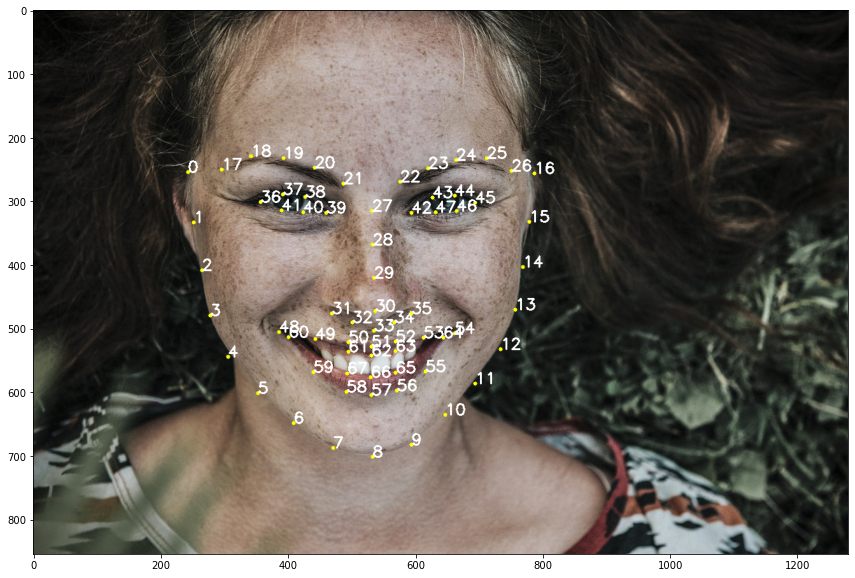

In [111]:
# Visualizando a imagem anotada:

plt.figure(figsize = (20,10))
plt.imshow(imagem_anotada)

In [112]:
# Utilizando a função com outra imagem:

imagem_pessoa = cv2.imread('images/px-man-happy.jpg')
imagem_pessoa = cv2.cvtColor(imagem_pessoa, cv2.COLOR_BGR2RGB)

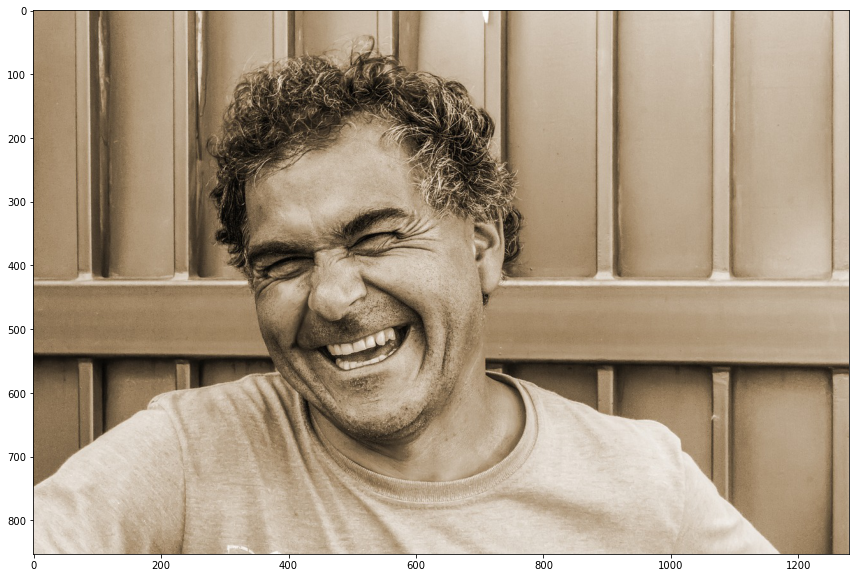

In [113]:
# Visualizando a imagem original:

plt.figure(figsize = (20,10))
plt.imshow(imagem_pessoa)

In [117]:
# Utilizando a função:

imagem_pessoa_anotada = imagem_pessoa.copy()
marcos_faciais = pontos_marcos_faciais(imagem_pessoa_anotada)
imagem_pessoa_anotada = anotar_marcos_faciais(imagem_pessoa_anotada, marcos_faciais)

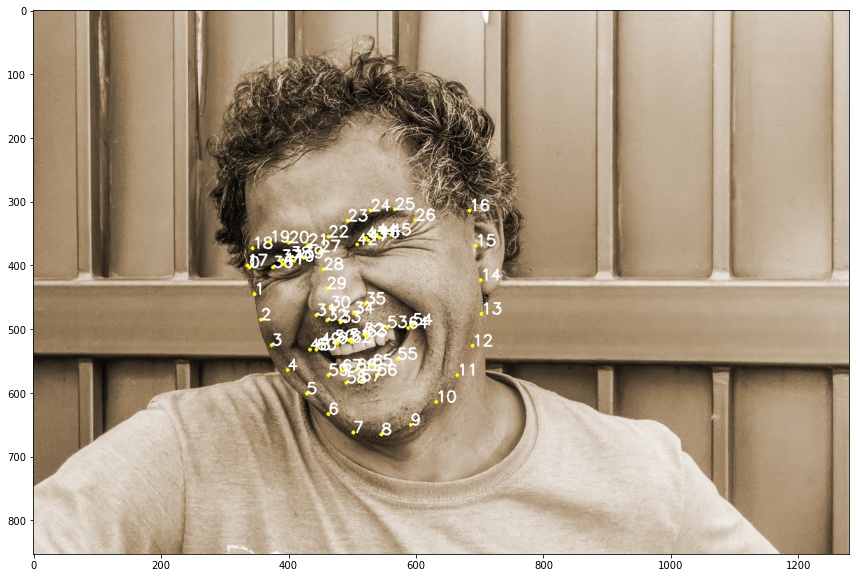

In [118]:
# Visualizando a imagem anotada:

plt.figure(figsize = (20,10))
plt.imshow(imagem_pessoa_anotada)

#### Após coletados os marcos faciais, podemos fazer análises como:

* Se os olhos estão ou não abertos;
* Se a pessoa está bocejando;
* Solução de problemas causados por zoom in e zoom out (análise de aspectos de razão);
* Entre outras.

In [120]:
# Criando listas de pontos de acordo com cada região:

face = list(range(1,68))
face_completa = list(range(0,68))
labio = list(range(48,61))
sobrancelha_dir = list(range(17,22))
sobrancelha_esq = list(range(22,27))
olho_dir = list(range(36,42))
olho_esq = list(range(42,48))
nariz = list(range(27,35))
mandibula = list(range(0,17))